In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import math
import string as str

In [3]:
cleaned_df = pd.read_csv("clean_data/cleaned_dataset.csv")

In [4]:
cleaned_df.describe()

,Unnamed: 0,ID,GROUP,CONDITION,Q1,Q2A,Q2B,Q2C,Q2D,Q2E,...,T2Q6B,T2Q6C,T2Q6D,T2Q6E,T2Q6F,T2Q6G,T2Q6H,T2Q6I,T2Q6J,AGE
count,523.000000,523.000000,523.000000,523.0,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,...,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000
mean,261.000000,261.000000,19.912046,1.0,6.499044,7.193117,9.671128,8.439771,8.586998,7.873805,...,7.309751,9.824092,10.782027,8.936902,11.053537,9.078394,7.753346,6.898662,8.695985,49.678776
std,151.121364,151.121364,11.571695,0.0,13.259042,12.862781,12.507579,14.129319,12.720755,12.132543,...,15.373499,14.113512,13.962535,14.606782,17.076485,11.954398,9.819753,14.422712,11.073307,16.782017
min,0.000000,0.000000,1.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-8.000000,0.000000,0.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,19.000000
25%,130.500000,130.500000,10.000000,1.0,3.000000,2.000000,6.000000,4.000000,5.000000,5.000000,...,1.000000,5.000000,7.000000,5.000000,5.000000,5.000000,5.000000,2.000000,5.000000,36.000000
50%,261.000000,261.000000,20.000000,1.0,5.000000,5.000000,8.000000,6.000000,7.000000,6.000000,...,5.000000,8.000000,9.000000,6.000000,8.000000,8.000000,7.000000,5.000000,7.000000,51.000000
75%,391.500000,391.500000,30.000000,1.0,6.000000,8.000000,10.000000,8.000000,9.000000,9.000000,...,7.000000,10.000000,10.000000,8.000000,10.000000,10.000000,8.000000,7.000000,10.000000,64.000000
max,522.000000,522.000000,40.000000,1.0,98.000000,77.000000,98.000000,98.000000,98.000000,98.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,87.000000


In [5]:
df_cols = list(cleaned_df.columns)

In [6]:
# around 76 rows contain skipped responses/multiple responses
cleaned_df.loc[cleaned_df.apply(lambda x: any(not(x[i] >= 0 and x[i] <= 77) for i in range(4,100)), axis=1)]

,Unnamed: 0,ID,GROUP,CONDITION,Q1,Q2A,Q2B,Q2C,Q2D,Q2E,...,T2Q6G,T2Q6H,T2Q6I,T2Q6J,RACE,AGEBRACKET,EDUCATION,PARTYBEFORE,GENDER,AGE
3,3,3,25,1,1,0,10,10,10,10,...,10,6,7,6,"White, non-Hispanic",60+,BA or above,Democrat,Female,77
8,8,8,28,1,8,1,9,10,9,9,...,10,8,6,10,"White, non-Hispanic",30-44,Some college,Democrat,Male,42
20,20,20,13,1,7,1,10,8,10,10,...,7,10,3,7,"Black, non-Hispanic",18-29,BA or above,Independent,Male,22
24,24,24,24,1,2,10,2,2,2,1,...,0,5,5,77,"White, non-Hispanic",60+,Some college,Independent,Female,65
27,27,27,2,1,1,8,10,5,10,2,...,5,10,7,10,"White, non-Hispanic",60+,BA or above,Independent,Female,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,504,504,28,1,7,5,6,7,7,6,...,98,98,98,98,"White, non-Hispanic",45-59,BA or above,Democrat,Female,54
505,505,505,31,1,6,3,7,8,8,8,...,9,8,6,10,"White, non-Hispanic",60+,BA or above,Democrat,Female,62
507,507,507,11,1,2,5,5,5,5,5,...,10,5,5,5,"Black, non-Hispanic",30-44,Some college,Democrat,Female,38
513,513,513,33,1,2,5,10,2,5,5,...,10,7,5,7,"White, non-Hispanic",60+,Some college,Republican,Female,71


In [7]:
# from Gemini
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",  # Inferred
    2: "Strongly oppose",       # Inferred
    3: "Moderately oppose",     # Inferred
    4: "Slightly oppose",       # Inferred
    5: "In the middle",
    6: "Slightly favor",        # Inferred
    7: "Moderately favor",      # Inferred
    8: "Strongly favor",        # Inferred
    9: "Very strongly favor",   # Inferred
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

In [8]:
questions = pd.read_csv("just_questions.csv")
qnum = questions['Variable'].to_list()
qtext = questions['Variable Label'].to_list()
q_dict = dict(zip(qnum,qtext))

(array([2. , 3. , 1. , 2.5, 3.5, 1.5]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

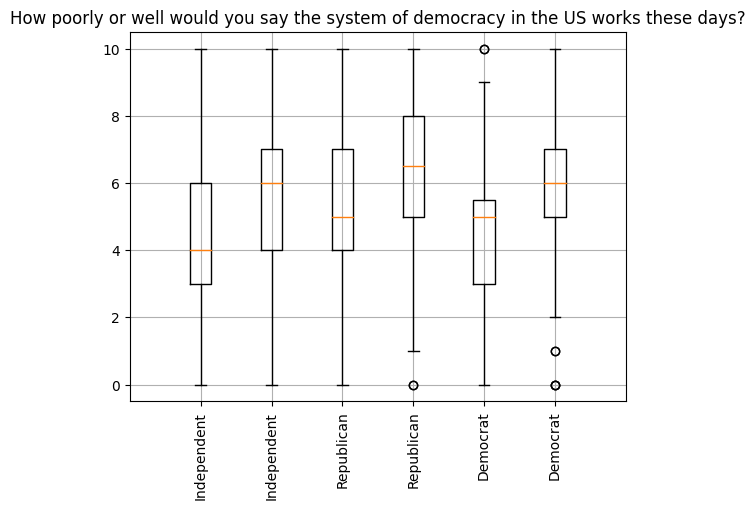

In [9]:
cleaned_q1 = cleaned_df[(cleaned_df['Q1'] <= 10) & (cleaned_df['Q1'] >= 0)]
cleaned_T2q1 = cleaned_df[(cleaned_df['T2Q1'] <= 10) & (cleaned_df['T2Q1'] >= 0)]

plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Republican']['Q1'], positions=[2], labels=["Republican"])
plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Democrat']['Q1'], positions=[3], labels=["Democrat"])
plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Independent']['Q1'], positions=[1], labels=["Independent"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Republican']['T2Q1'], positions=[2.5], labels=["Republican"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Democrat']['T2Q1'], positions=[3.5], labels=["Democrat"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Independent']['T2Q1'], positions=[1.5], labels=["Independent"])
plt.grid()
plt.title(q_dict["Q1"])
plt.xticks(rotation=90)

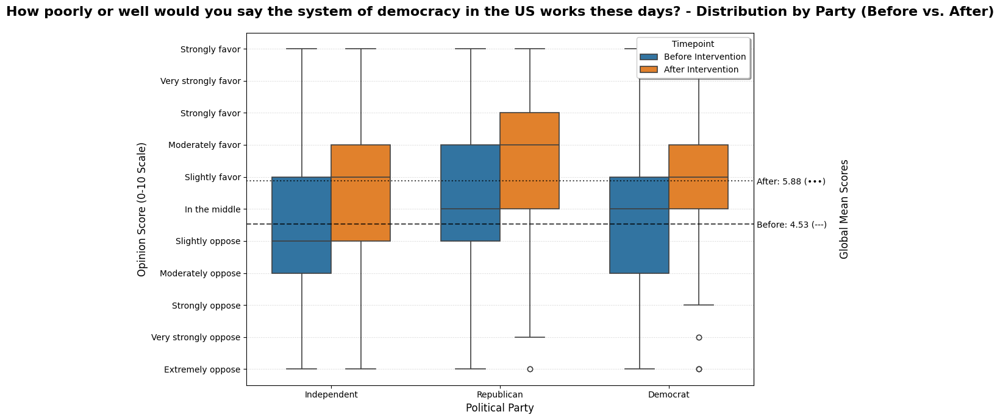

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Configuration Variable for Reusability ---
# CHANGE THIS VARIABLE to reuse the script for a different question pair.
# Example: To plot Q2A vs T2Q2A, set QUESTION_PREFIX = 'Q2A'
QUESTION_PREFIX = 'Q1'

# --- Placeholder for assumed variables (Ensure these are defined in your environment) ---
# cleaned_df = ...  # Your main DataFrame
# q_dict = ...      # Your dictionary mapping 'Q1' to the question text

# --- Likert Scale Mapping ---
# Dictionary to map numerical scores to descriptive text labels.
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",
    2: "Strongly oppose",
    3: "Moderately oppose",
    4: "Slightly oppose",
    5: "In the middle",
    6: "Slightly favor",
    7: "Moderately favor",
    8: "Strongly favor",
    9: "Very strongly favor",
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

# --- Dynamic Column Names ---
Q_COL = QUESTION_PREFIX
T2Q_COL = f'T2{QUESTION_PREFIX}'

# --- 1. Data Filtering (Removes special codes and ensures 0-10 range) ---
# Use dynamic column names for filtering
valid_mask = cleaned_df[Q_COL].between(0, 10) & cleaned_df[T2Q_COL].between(0, 10)
df_filtered = cleaned_df[valid_mask].copy()

# --- 2. Data Transformation (Melting to 'Long' Format for Seaborn) ---
# Use dynamic column names for melting
df_long = pd.melt(
    df_filtered,
    id_vars=['PARTYBEFORE'],
    value_vars=[Q_COL, T2Q_COL],
    var_name='Timepoint',
    value_name='Opinion Score'
)

# Map the Timepoint labels for better chart readability
df_long['Timepoint'] = df_long['Timepoint'].map({
    Q_COL: 'Before Intervention', 
    T2Q_COL: 'After Intervention'
})

# --- 3. Mean Calculation for Hlines ---
# Calculate the overall global mean for Before (Q) and After (T2Q) separately.
mean_before = df_filtered[Q_COL].mean()
mean_after = df_filtered[T2Q_COL].mean()

# --- 4. Plotting with Seaborn and Matplotlib ---
plt.figure(figsize=(12, 7))

# Define distinct colors for the 'Before' and 'After' time points
boxplot_palette = {'Before Intervention': '#1f77b4', 'After Intervention': '#ff7f0e'}

# Create the grouped box plot
# Use ax to get the axes object for secondary axis
ax = sns.boxplot(
    data=df_long,
    x='PARTYBEFORE',
    y='Opinion Score',
    hue='Timepoint',
    palette=boxplot_palette,
    width=0.7,
    dodge=True,
    linewidth=1.2
)

# --- 5. Add Global Mean Horizontal Lines (Hlines) ---

# Draw the 'Before' mean line (Black, Dashed)
ax.axhline(
    y=mean_before,
    color='black',
    linestyle='--', # Dashed line
    linewidth=1.5,
    alpha=0.7,
    zorder=10 
)

# Draw the 'After' mean line (Black, Dotted)
ax.axhline(
    y=mean_after,
    color='black',
    linestyle=':', # Dotted line for clear distinction
    linewidth=1.5,
    alpha=0.7,
    zorder=10
)

# --- 6. Aesthetics and Final Touches ---
plt.title(
    f'{q_dict[Q_COL]} - Distribution by Party (Before vs. After)',
    fontsize=16,
    fontweight='bold',
    pad=20
)
ax.set_xlabel('Political Party', fontsize=12)
ax.set_ylabel('Opinion Score (0-10 Scale)', fontsize=12)

# --- Custom Left Y-Axis Ticks (Likert Labels) ---
ax.set_ylim(-0.5, 10.5)
tick_values = np.arange(0, 11, 1)

# Create labels: full text for 0, 5, 10; empty string for others
custom_labels = [
    likert_scale_map.get(i, '') 
    for i in tick_values
]

# Set all ticks from 0 to 10, but only 0, 5, 10 have text labels
ax.set_yticks(
    ticks=tick_values, 
    labels=custom_labels,
    fontsize=10
)

# --- Custom Right Y-Axis Ticks (Mean Labels) ---
# Create a secondary axis that shares the Y-limit
ax2 = ax.secondary_yaxis('right')

# Define the tick locations and labels for the means
mean_ticks = [mean_before, mean_after]
mean_labels = [
    f'Before: {mean_before:.2f} (---)',
    f'After: {mean_after:.2f} (•••)'
]

ax2.set_yticks(
    ticks=mean_ticks,
    labels=mean_labels,
    fontsize=10,
    color='black',
)

# Remove the default tick lines from the secondary axis, keeping only the labels
ax2.tick_params(axis='y', length=0)
ax2.set_ylabel("Global Mean Scores", fontsize=12, labelpad=15) # Optional: Label the right axis

# Add a legend to clearly explain the color difference
ax.legend(title='Timepoint', loc='upper right', frameon=True, shadow=True, fancybox=True)

# Add grid lines for better readability against the Y-axis scale
ax.grid(axis='y', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Placeholder for assumed variables (Ensure these are defined in your environment) ---
# cleaned_df = ...  # Your main DataFrame
# q_dict = ...      # Your dictionary mapping 'Q1' to the question text

# --- Likert Scale Mapping (Required by the function) ---
# Dictionary to map numerical scores to descriptive text labels.
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",
    2: "Strongly oppose",
    3: "Moderately oppose",
    4: "Slightly oppose",
    5: "In the middle",
    6: "Slightly favor",
    7: "Moderately favor",
    8: "Strongly favor",
    9: "Very strongly favor",
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

def plot_time_comparison(question_prefix, cleaned_df, q_dict, likert_scale_map):
    """
    Generates a grouped box plot comparing opinion scores before (Q) and after (T2Q) 
    an intervention, grouped by political party.

    Includes custom Likert scale labels on the left Y-axis and global mean scores 
    as ticks on the right Y-axis for clear visual analysis.

    Args:
        question_prefix (str): The base name of the question column (e.g., 'Q1', 'Q2A').
        cleaned_df (pd.DataFrame): The DataFrame containing the survey data.
        q_dict (dict): A dictionary mapping question codes to their full text.
        likert_scale_map (dict): A dictionary mapping 0-10 scores to descriptive text.
    """
    # --- Dynamic Column Names ---
    Q_COL = question_prefix
    T2Q_COL = f'T2{question_prefix}'

    # --- 1. Data Filtering (Removes special codes and ensures 0-10 range) ---
    try:
        valid_mask = cleaned_df[Q_COL].between(0, 10) & cleaned_df[T2Q_COL].between(0, 10)
        df_filtered = cleaned_df[valid_mask].copy()
    except KeyError as e:
        print(f"Error: Column {e} not found. Check if the QUESTION_PREFIX '{question_prefix}' is correct.")
        return

    # --- 2. Data Transformation (Melting to 'Long' Format for Seaborn) ---
    df_long = pd.melt(
        df_filtered,
        id_vars=['PARTYBEFORE'],
        value_vars=[Q_COL, T2Q_COL],
        var_name='Timepoint',
        value_name='Opinion Score'
    )

    # Map the Timepoint labels for better chart readability
    df_long['Timepoint'] = df_long['Timepoint'].map({
        Q_COL: 'Before', 
        T2Q_COL: 'After'
    })

    # --- 3. Mean Calculation for Hlines ---
    mean_before = df_filtered[Q_COL].mean()
    mean_after = df_filtered[T2Q_COL].mean()

    # --- 4. Plotting with Seaborn and Matplotlib ---
    plt.figure(figsize=(12, 7))

    # Define distinct colors for the 'Before' and 'After' time points
    boxplot_palette = {'Before': '#1f77b4', 'After': '#ff7f0e'}

    # Create the grouped box plot
    ax = sns.boxplot(
        data=df_long,
        x='PARTYBEFORE',
        y='Opinion Score',
        hue='Timepoint',
        palette=boxplot_palette,
        width=0.7,
        dodge=True,
        linewidth=1.2
    )

    # --- 5. Add Global Mean Horizontal Lines (Hlines) ---

    # Draw the 'Before' mean line (Black, Dashed)
    ax.axhline(
        y=mean_before,
        color='black',
        linestyle='--', # Dashed line
        linewidth=1.5,
        alpha=0.7,
        zorder=10 
    )

    # Draw the 'After' mean line (Black, Dotted)
    ax.axhline(
        y=mean_after,
        color='black',
        linestyle=':', # Dotted line for clear distinction
        linewidth=1.5,
        alpha=0.7,
        zorder=10
    )

    # --- 6. Aesthetics and Final Touches ---
    ax.set_title(
        f'{q_dict.get(Q_COL, Q_COL)} - Distribution by Party (Before vs. After)',
        fontsize=16,
        fontweight='bold',
        pad=20
    )
    ax.set_xlabel('Political Party', fontsize=12)
    ax.set_ylabel('Opinion Score (0-10 Scale)', fontsize=12)

    # --- Custom Left Y-Axis Ticks (Likert Labels) ---
    ax.set_ylim(-0.5, 10.5)
    tick_values = np.arange(0, 11, 1)

    # Create labels: full text for 0, 5, 10; empty string for others
    custom_labels = [
        likert_scale_map.get(i, '') 
        for i in tick_values
    ]

    # Set all ticks from 0 to 10, but only 0, 5, 10 have text labels
    ax.set_yticks(
        ticks=tick_values, 
        labels=custom_labels,
        fontsize=10
    )

    # --- Custom Right Y-Axis Ticks (Mean Labels) ---
    # Create a secondary axis that shares the Y-limit
    ax2 = ax.secondary_yaxis('right')

    # Define the tick locations and labels for the means
    mean_ticks = [mean_before, mean_after]
    mean_labels = [
        f'Before: {mean_before:.2f} (---)',
        f'After: {mean_after:.2f} (•••)'
    ]

    ax2.set_yticks(
        ticks=mean_ticks,
        labels=mean_labels,
        fontsize=10,
        color='black',
    )

    # Remove the default tick lines from the secondary axis, keeping only the labels
    ax2.tick_params(axis='y', length=0)
    ax2.set_ylabel("Global Mean Scores", fontsize=12, labelpad=15)

    # Add a legend to clearly explain the color difference, placing it outside the plot area
    ax.legend(title='Timepoint', loc='upper left', bbox_to_anchor=(1.02, 1), frameon=True, shadow=True, fancybox=True)

    # Add grid lines for better readability against the Y-axis scale
    ax.grid(axis='y', linestyle=':', alpha=0.6)

    plt.tight_layout()
    plt.show()

# --- Example of how to call the function ---
# Assuming you have the data loaded:
# plot_time_comparison('Q1', cleaned_df, q_dict, likert_scale_map)


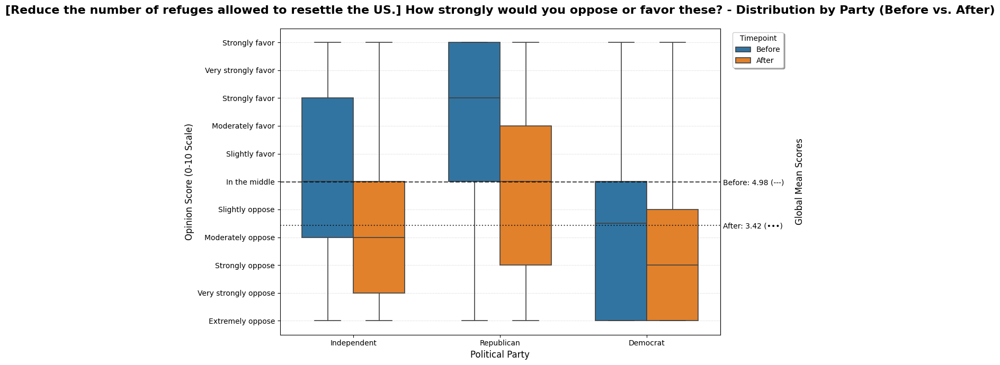

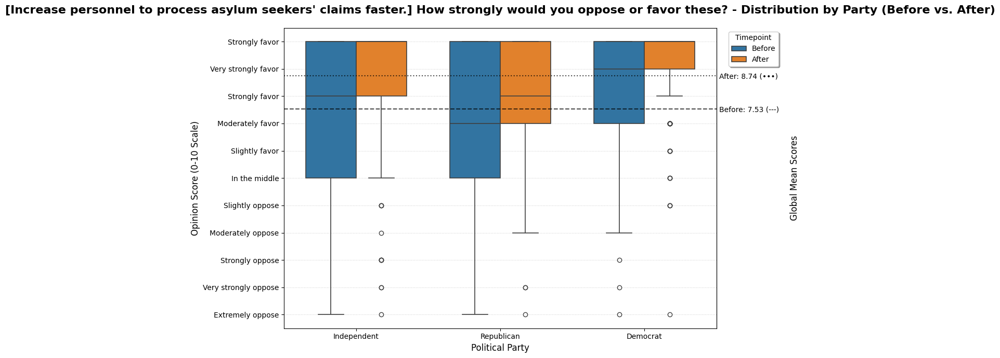

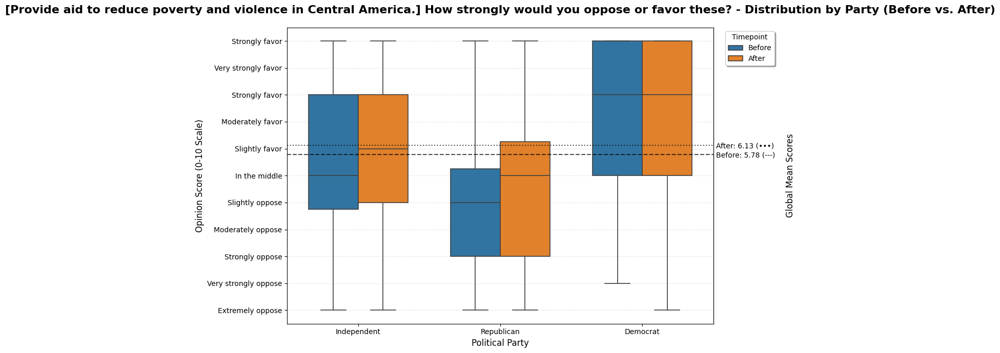

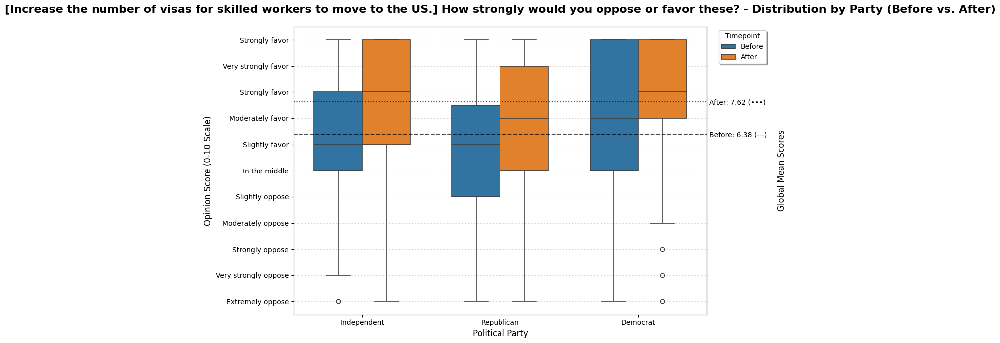

In [12]:
plot_time_comparison('Q2A', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2B', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2C', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2D', cleaned_df, q_dict, likert_scale_map)

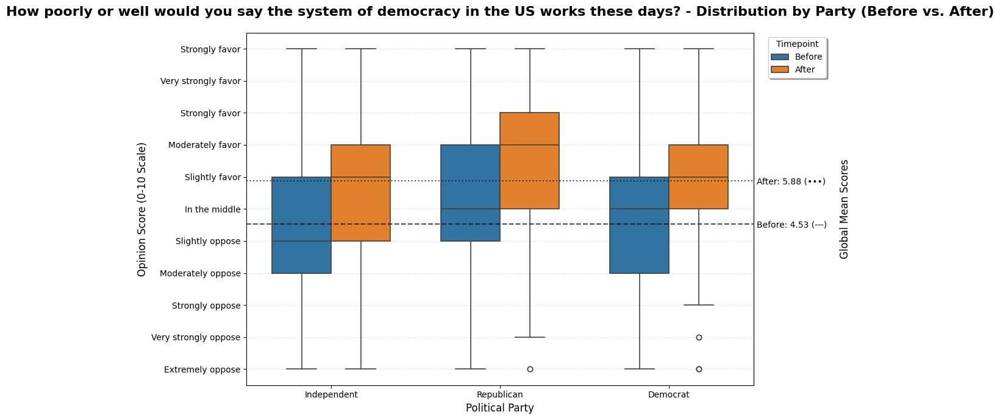

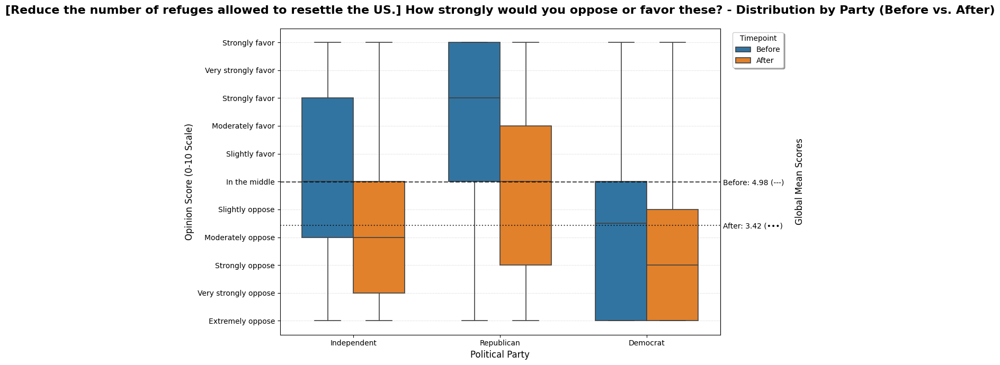

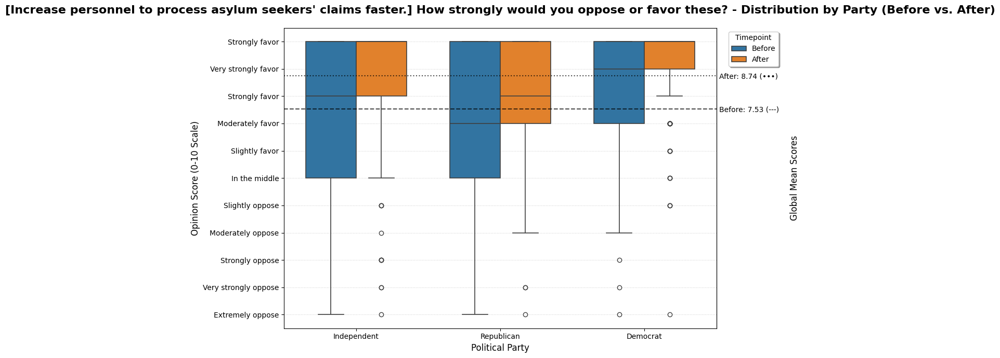

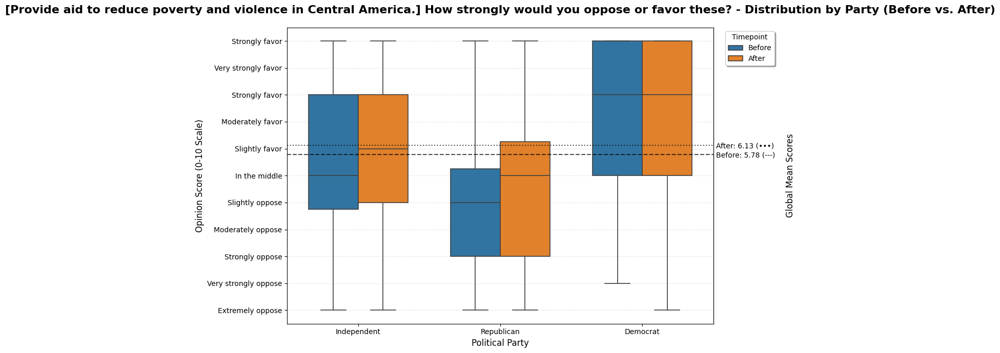

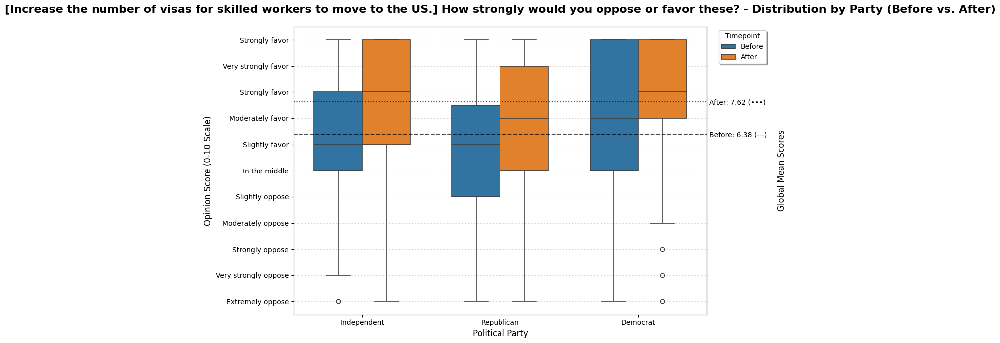

...

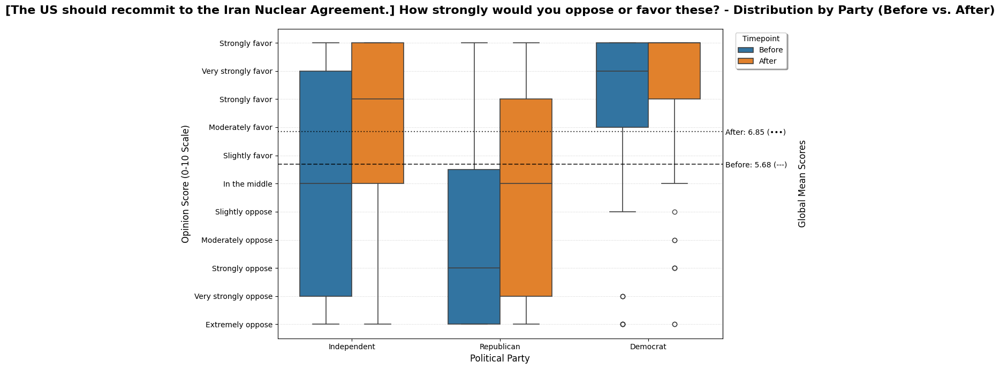

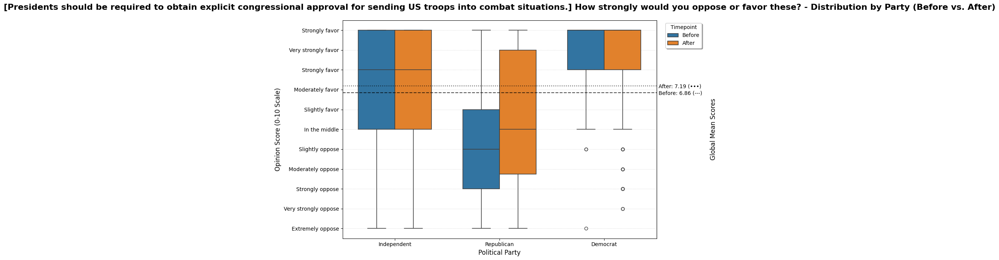

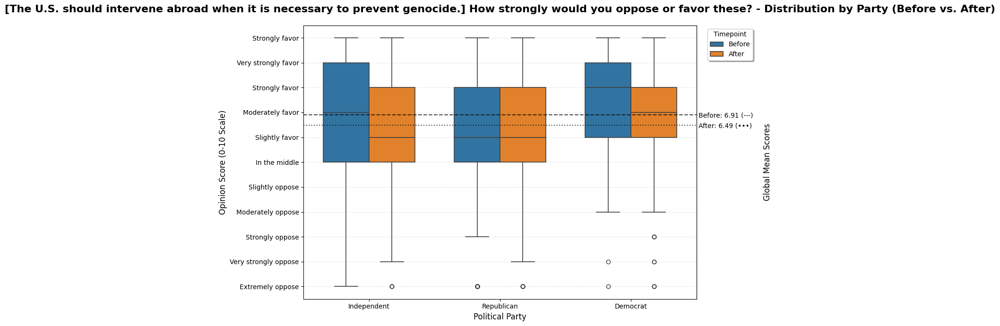

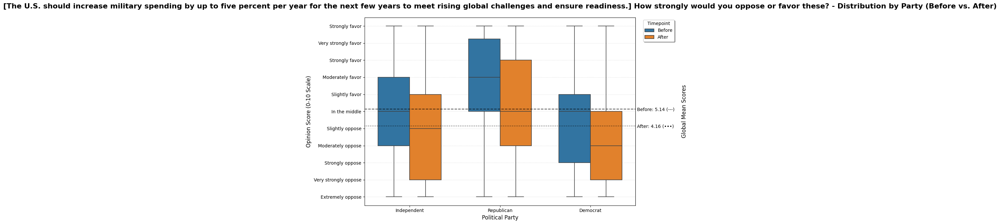

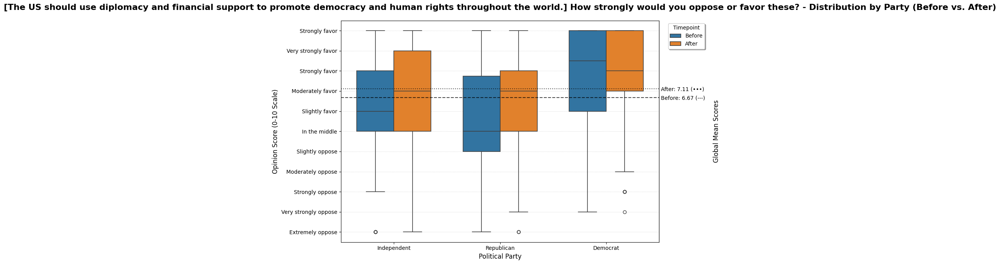

In [13]:
for q in questions['Variable'].to_list():
    plot_time_comparison(q, cleaned_df, q_dict, likert_scale_map)

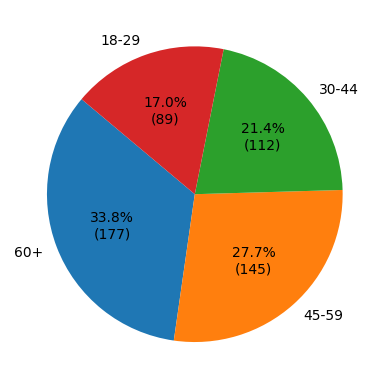

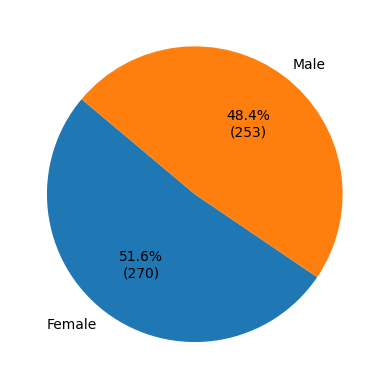

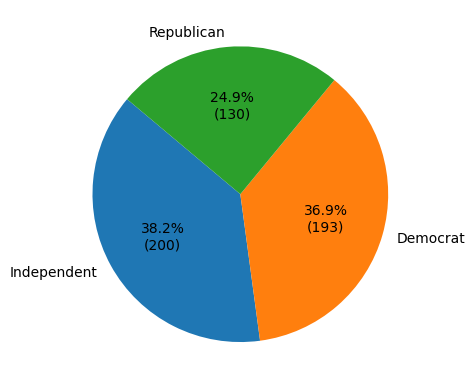

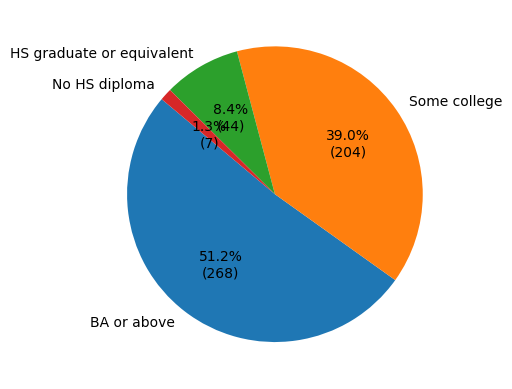

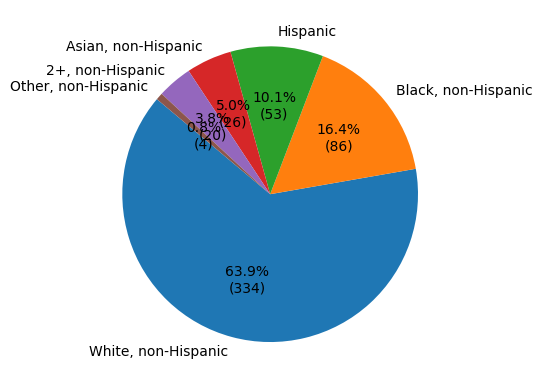

In [14]:
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def plot_demographics(df, colname):
    s = df[colname].value_counts()
    plt.pie(s, labels=s.index, autopct=autopct_format(s), startangle=140)
    plt.show()

for col in ["AGEBRACKET", "GENDER", "PARTYBEFORE", "EDUCATION", "RACE"]:
    plot_demographics(cleaned_df, col)

In [15]:
cleaned_df.groupby("GROUP")[["PARTYBEFORE"]].value_counts().reset_index()

,GROUP,PARTYBEFORE,0
0,1,Independent,6
1,1,Democrat,4
2,1,Republican,4
3,2,Independent,9
4,2,Democrat,7
...,...,...,...
112,39,Independent,8
113,39,Republican,4
114,40,Democrat,5
115,40,Independent,5


In [16]:
COLS = 8
ROWS = 5 

default_colors = plt.cm.get_cmap('tab10').colors 

# Specific color map for 'PARTYBEFORE' for consistency
party_colors = {
    'Republican': '#D62728',  # Red
    'Democrat': '#1f77b4',    # Blue
    'Independent': '#2CA02C'  # Green
}
def plot_group_composition(df, category_col):
    """
    Generates a grid of pie charts showing the distribution of a categorical 
    variable (e.g., PARTYBEFORE, GENDER) within each unique intervention group.

    Args:
        df (pd.DataFrame): The DataFrame containing 'GROUP' and the category column.
        category_col (str): The name of the categorical column to plot (e.g., 'PARTYBEFORE').
    """
    
    # 1. Aggregate the data: Count category values within each group
    df_counts = df.groupby("GROUP")[category_col].value_counts().reset_index(name='count')

    unique_groups = df_counts['GROUP'].unique()
    num_groups = len(unique_groups)

    if num_groups == 0:
        print(f"Error: No unique groups found in the '{category_col}' column.")
        return

    # 2. Determine and standardize the color map
    # Get all unique categories present in the entire dataset for this column
    all_categories = df[category_col].unique()
    
    if category_col == 'PARTYBEFORE':
        color_map = party_colors
    else:
        # Create a dynamic color map for other categories based on the full list of categories
        color_map = {cat: default_colors[i % len(default_colors)] 
                     for i, cat in enumerate(all_categories)}
    
    # Get the standard order and corresponding colors for the legend
    legend_labels = sorted(all_categories)
    legend_colors = [color_map.get(cat, 'gray') for cat in legend_labels]

    # 3. Setup the Figure and Axes
    plot_rows = min(ROWS, int(np.ceil(num_groups / COLS)))
    # Add extra width to the figure size to accommodate the legend on the right
    fig, axes = plt.subplots(plot_rows, COLS, figsize=(4 * COLS + 3, 4 * plot_rows))
    axes = axes.flatten() 

    # 4. Plotting Loop
    for i, group in enumerate(unique_groups):
        ax = axes[i]

        # Filter data for the current group
        df_group = df_counts[df_counts['GROUP'] == group]

        # Prepare data, aligning labels to ensure consistent colors
        sizes = []
        labels_present = []
        colors = []
        
        # Iterate over the standardized category order to ensure legend/color consistency
        for cat in legend_labels:
            count = df_group[df_group[category_col] == cat]['count'].sum()
            if count > 0:
                sizes.append(count)
                labels_present.append(cat)
                colors.append(color_map.get(cat, 'gray'))
            
        # Create the pie chart 
        wedges, texts, autotexts = ax.pie(
            sizes,
            autopct='%1.1f%%',
            startangle=90,
            colors=colors,
            wedgeprops={'edgecolor': 'black', 'linewidth': 0.5},
            textprops={'fontsize': 8}
        )
        ax.set_title(f'Group: {group}', fontsize=10, fontweight='bold')
        ax.axis('equal') 

    # 5. Hide any unused subplots
    for i in range(num_groups, plot_rows * COLS):
        fig.delaxes(axes[i])

    # 6. Add a single legend for the entire figure
    # We create dummy patches for the legend using the colors defined above
    legend_patches = [plt.Rectangle((0, 0), 1, 1, fc=lc) for lc in legend_colors]

    fig.legend(
        legend_patches, 
        legend_labels, 
        loc='center right', 
        # Move the legend further out to clear the plots entirely
        bbox_to_anchor=(1.0, 0.5), 
        title=category_col, # Use the column name as the legend title
        fontsize=10,
        title_fontsize=12,
        fancybox=True
    )

    # Adjust tight_layout to account for the space taken by the legend on the right
    fig.suptitle(f'{category_col} Distribution within Intervention Groups', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95]) # Rect adjusted from 0.95 to 0.9
    plt.show()


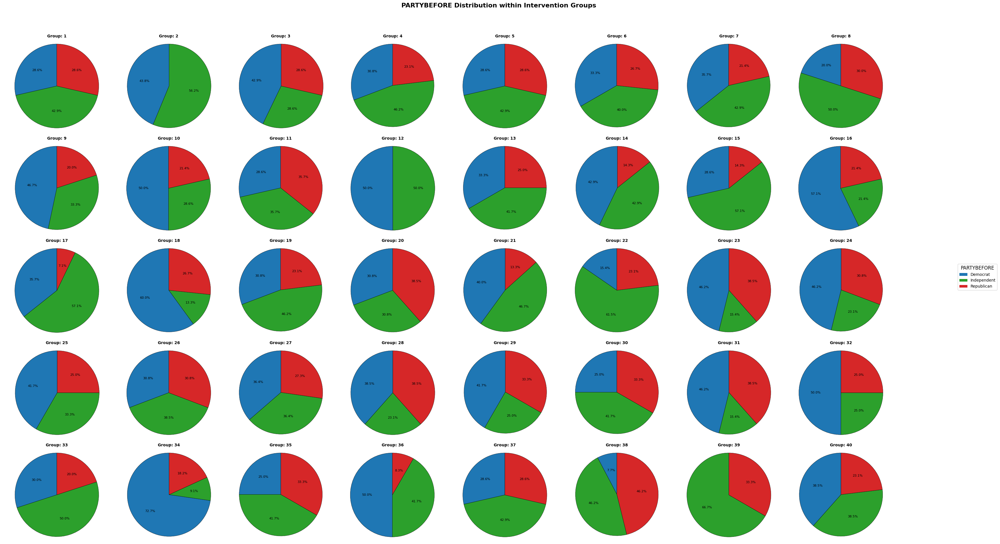

In [17]:
plot_group_composition(cleaned_df, 'PARTYBEFORE')

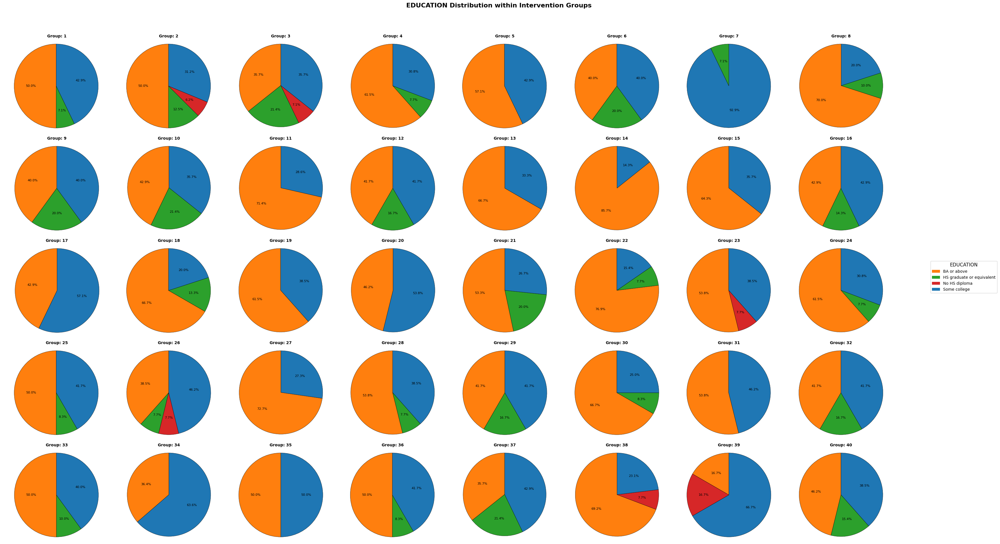

In [18]:
plot_group_composition(cleaned_df, 'EDUCATION')

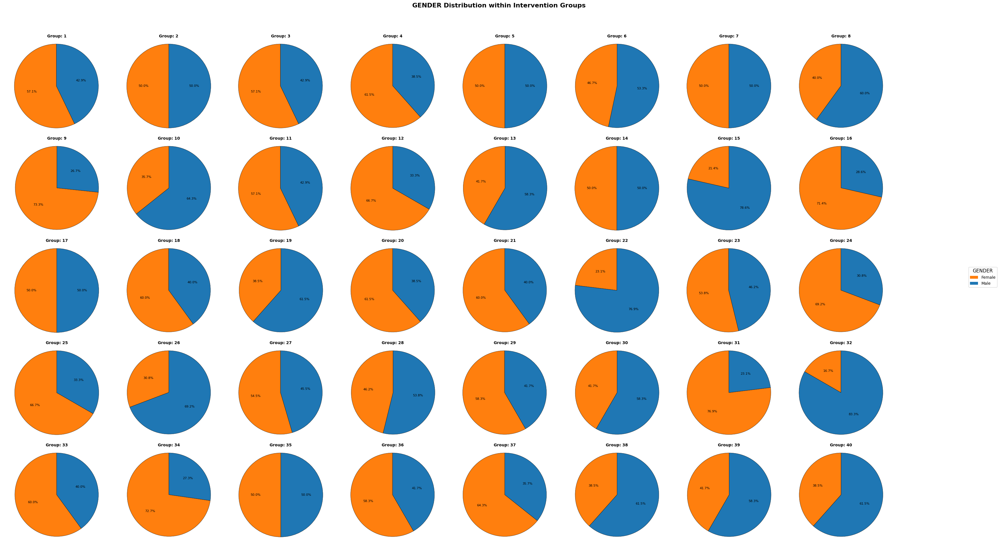

In [19]:
plot_group_composition(cleaned_df, 'GENDER')

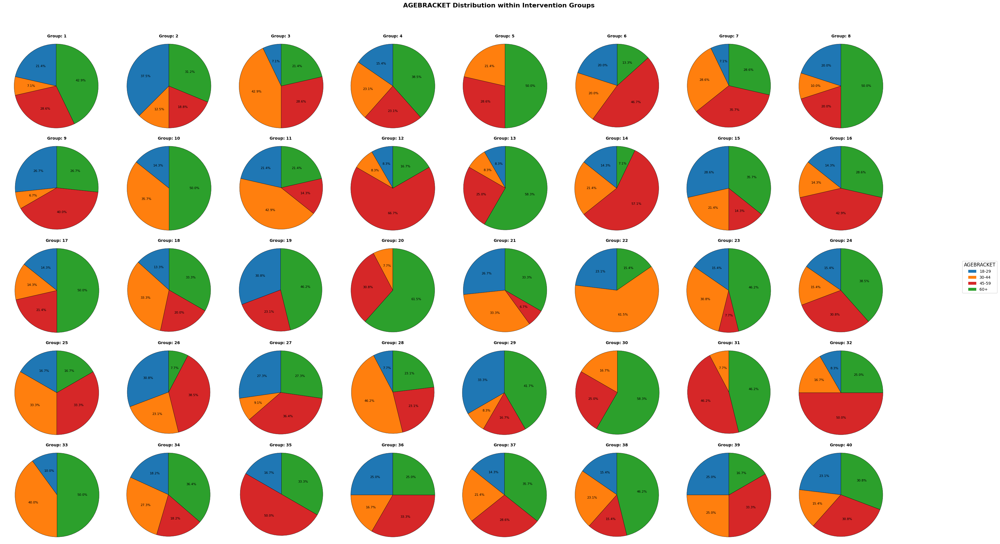

In [20]:
plot_group_composition(cleaned_df, 'AGEBRACKET')

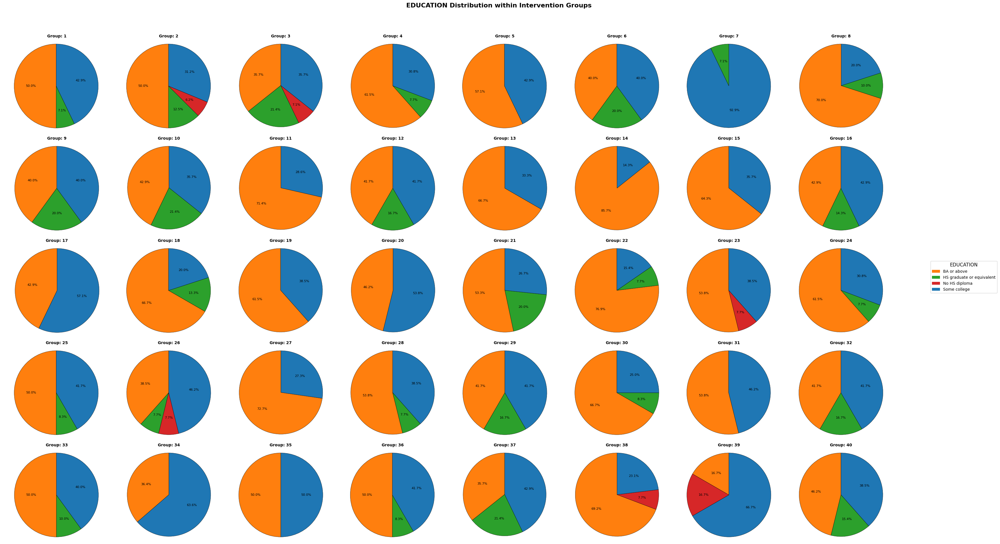

In [21]:
plot_group_composition(cleaned_df, 'EDUCATION')

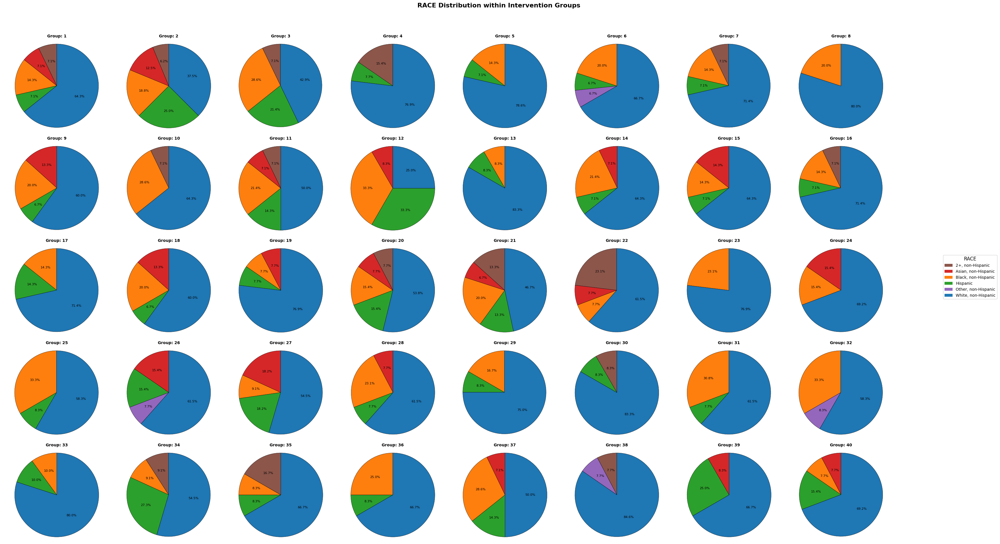

In [22]:
plot_group_composition(cleaned_df, 'RACE')

In [23]:
# i need to calculate how much opinions shift happen per group per "Q1" and "T2Q1" pair
subset_df = cleaned_df[['GROUP', 'Q1', 'T2Q1']]
subset_df = subset_df[(subset_df['Q1'] >= 0) & (subset_df['Q1'] <= 10) & (subset_df['T2Q1'] >= 0) & (subset_df['T2Q1'] <= 10)]

In [24]:
subset_df['OpinionShift'] = abs(subset_df['T2Q1'] - subset_df['Q1'])
subset_df['ShiftToAgree'] = subset_df.apply(lambda x: 1 if x['T2Q1'] > x['Q1'] else (-1 if x['T2Q1'] < x['Q1'] else 0), axis=1)

In [25]:
subset_df.groupby('GROUP')[['OpinionShift','ShiftToAgree']].mean().reset_index()

,GROUP,OpinionShift,ShiftToAgree
0,1,2.285714,0.714286
1,2,3.000000,0.750000
2,3,1.692308,0.076923
3,4,1.583333,0.416667
4,5,1.846154,0.769231
5,6,2.000000,0.533333
6,7,1.846154,0.384615
7,8,1.888889,0.555556
8,9,1.933333,0.200000
9,10,2.142857,0.714286


In [26]:
# i want to group by the "group" column and see how many people shifted their opinions positively, negatively, or not at all
shift_summary = subset_df.groupby('GROUP')['ShiftToAgree'].value_counts().unstack(fill_value=0)

In [27]:
question_data = []
for q in questions['Variable'].to_list():
    t2q = 'T2' + q
    subset_df = cleaned_df[['GROUP', q, t2q]]
    subset_df = subset_df[(subset_df[q] >= 0) & (subset_df[q] <= 10) & (subset_df[t2q] >= 0) & (subset_df[t2q] <= 10)]

    subset_df['OpinionShift'] = abs(subset_df[t2q] - subset_df[q])
    subset_df['ShiftToAgree'] = subset_df.apply(lambda x: 1 if x[t2q] > x[q] else (-1 if x[t2q] < x[q] else 0), axis=1)
    
    shift_group_summary = subset_df.groupby('GROUP')[['OpinionShift','ShiftToAgree']].mean()
    shift_individual_summary = subset_df[['OpinionShift','ShiftToAgree']].mean()
    
    
    question_data.append((q, shift_group_summary.mean()[0], shift_group_summary.mean()[1], shift_individual_summary['OpinionShift'], shift_individual_summary['ShiftToAgree']))

    print(f"Shift Summary for {q}:")
    print(shift_summary)
    print("\n")


Shift Summary for Q1:
ShiftToAgree  -1   0   1
GROUP                   
1              1   2  11
2              2   0  14
3              5   2   6
4              3   1   8
5              1   1  11
6              2   3  10
7              3   2   8
8              1   2   6
9              5   2   8
10             1   2  11
11             1   0  13
12             1   2   9
13             2   1   7
14             4   1   8
15             1   1  12
16             0   4   8
17             1   3   7
18             3   4   8
19             1   2  10
20             4   2   5
21             2   2  11
22             6   1   4
23             2   1   8
24             2   3   7
25             3   1   7
26             2   3   8
27             3   3   5
28             1   6   5
29             1   1  10
30             1   1  10
31             5   2   6
32             0   2   9
33             1   2   6
34             2   1   7
35             0   5   6
36             1   3   6
37             6   0   6
38 

In [28]:
responseSummary = pd.DataFrame(question_data, columns=['Question', 'AvgGroupOpinionShift', 'AvgGroupShiftToAgree', 'AvgIndividualOpinionShift', 'AvgIndividualShiftToAgree'])

In [29]:
# if Q1 then i should map to Topic 1, if Q2A, Q2B, Q2C, Q2D then Topic 2, etc
def map_question_to_topic(question):
    if question.startswith('Q1'):
        return 'Democracy'
    elif question.startswith('Q2'):
        return 'Immigration'
    elif question.startswith('Q3'):
        return 'Climate Change'
    elif question.startswith('Q4'):
        return 'Taxes'
    elif question.startswith('Q5'):
        return 'Healthcare'
    else:
        return 'Global Position'

responseSummary['Topic'] = responseSummary['Question'].apply(map_question_to_topic)

In [30]:
responseSummary.groupby('Topic')[['AvgGroupOpinionShift', 'AvgGroupShiftToAgree', 'AvgIndividualOpinionShift', 'AvgIndividualShiftToAgree']].mean().reset_index()

,Topic,AvgGroupOpinionShift,AvgGroupShiftToAgree,AvgIndividualOpinionShift,AvgIndividualShiftToAgree
0,Climate Change,1.727625,-0.001182,1.725822,-0.003006
1,Democracy,2.109600,0.470662,2.134694,0.475510
2,Global Position,1.905939,0.083778,1.905449,0.081748
3,Healthcare,1.870959,0.063880,1.864768,0.063197
4,Immigration,2.148963,0.088067,2.145476,0.089403
5,Taxes,2.287226,-0.148192,2.283348,-0.148893


In [31]:
cleaned_df.columns

Index(['Unnamed: 0', 'ID', 'GROUP', 'CONDITION', 'Q1', 'Q2A', 'Q2B', 'Q2C',
       'Q2D', 'Q2E',
       ...
       'T2Q6G', 'T2Q6H', 'T2Q6I', 'T2Q6J', 'RACE', 'AGEBRACKET', 'EDUCATION',
       'PARTYBEFORE', 'GENDER', 'AGE'],
      dtype='object', length=106)

In [32]:
participant_df = cleaned_df[['ID','GROUP','RACE','AGEBRACKET','EDUCATION','PARTYBEFORE','GENDER','AGE']].drop_duplicates() 

In [33]:
questionMasterDf = []
for q in questions['Variable'].to_list():
    t2q = 'T2' + q
    subset_df = cleaned_df[['ID', q, t2q]]
    subset_df['ValidResponse'] = subset_df.apply(lambda x: True if (x[q] >= 0 and x[q] <= 10 and x[t2q] >= 0 and x[t2q] <= 10) else False, axis=1)
    subset_df['BeforeNumber'] = subset_df[q]
    subset_df['BeforeResponse'] = subset_df[q].map(likert_scale_map)
    subset_df['AfterNumber'] = subset_df[t2q]
    subset_df['AfterResponse'] = subset_df[t2q].map(likert_scale_map)
    subset_df['Question'] = q
    subset_df['QuestionText'] = q_dict[q]
    subset_df['Topic'] = map_question_to_topic(q)
    subset_df = subset_df[['ID', 'Question', 'QuestionText', 'Topic', 'ValidResponse', 'BeforeNumber', 'BeforeResponse', 'AfterNumber', 'AfterResponse']]
    questionMasterDf.append(subset_df)
master_df = pd.concat(questionMasterDf, ignore_index=True)
    

/var/folders/qw/dj7vjbyd6kb8q83q6chjb9m00000gn/T/ipykernel_41098/727654753.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['ValidResponse'] = subset_df.apply(lambda x: True if (x[q] >= 0 and x[q] <= 10 and x[t2q] >= 0 and x[t2q] <= 10) else False, axis=1)
/var/folders/qw/dj7vjbyd6kb8q83q6chjb9m00000gn/T/ipykernel_41098/727654753.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['BeforeNumber'] = subset_df[q]
/var/folders/qw/dj7vjbyd6kb8q83q6chjb9m00000gn/T/ipykernel_41098/727654753

In [34]:
master_df = master_df.merge(participant_df, on='ID', how='left')
master_df.to_csv("clean_data/question_level_master_dataset.csv", index=False)

In [35]:
master_df['OpinionShift'] = master_df['AfterNumber'] - master_df['BeforeNumber']

In [36]:
plotting_data = master_df[master_df['ValidResponse'] == True]
df = plotting_data.groupby(['Topic', 'Question', 'GROUP'])['OpinionShift'].mean().reset_index()

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
 

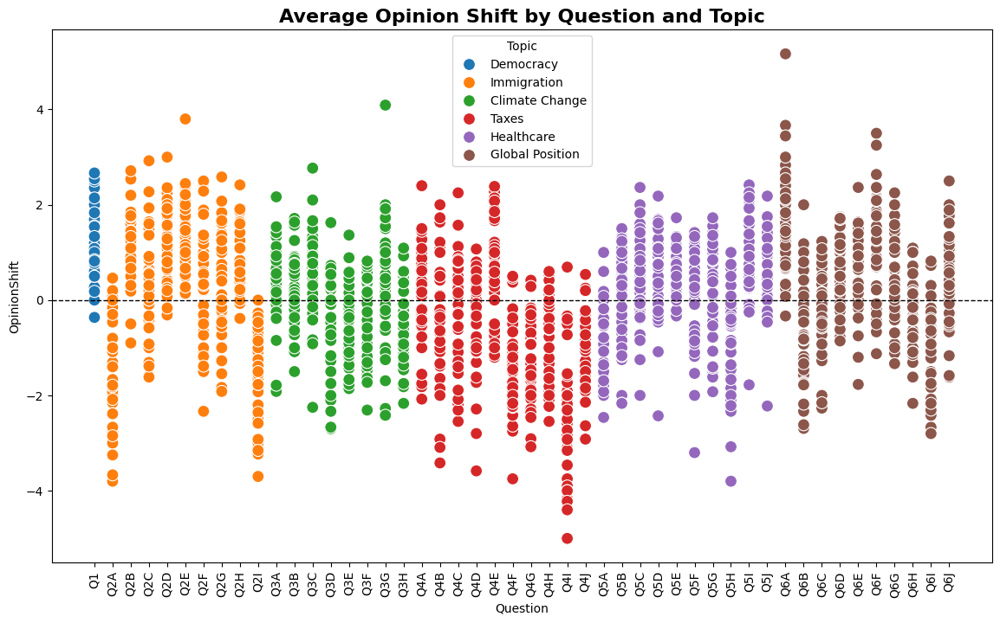

In [37]:
# plot question on the x axis, opinion shift on the y axis with scatters, coloured by topic
df.sort_values(by='Question', inplace=True)
fig = plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.scatterplot(data=df, x='Question', y='OpinionShift', hue='Topic', s=100)
plt.title('Average Opinion Shift by Question and Topic', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
 

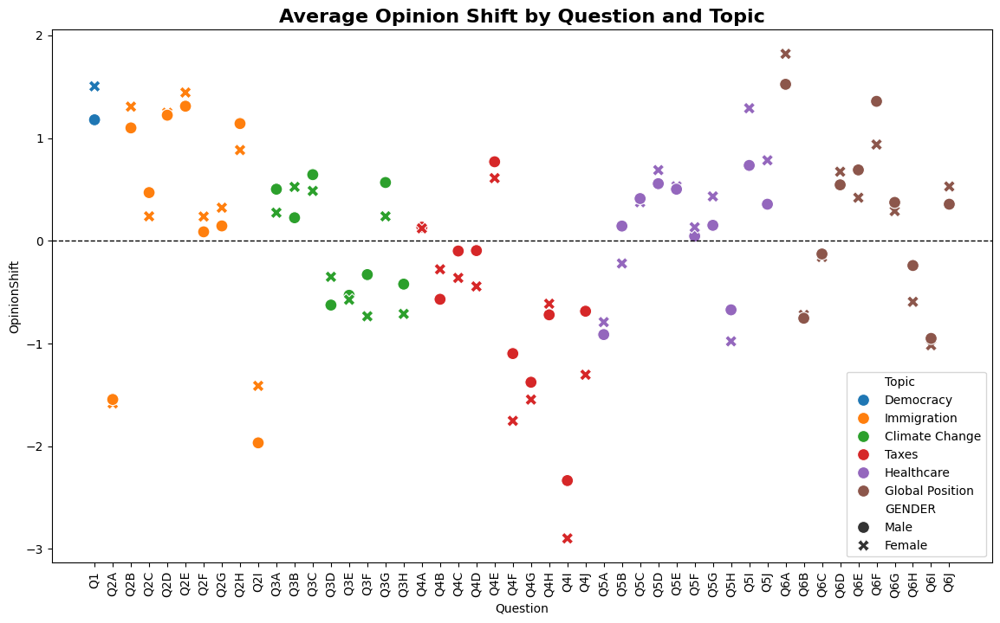

In [38]:
# plot question on the x axis, opinion shift on the y axis with scatters, coloured by topic
df = plotting_data.groupby(['Topic', 'Question', 'GENDER'])['OpinionShift'].mean().reset_index()
df.sort_values(by='Question', inplace=True)
fig = plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.scatterplot(data=df, x='Question', y='OpinionShift', hue='Topic', style='GENDER', s=100)
plt.title('Average Opinion Shift by Question and Topic', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)

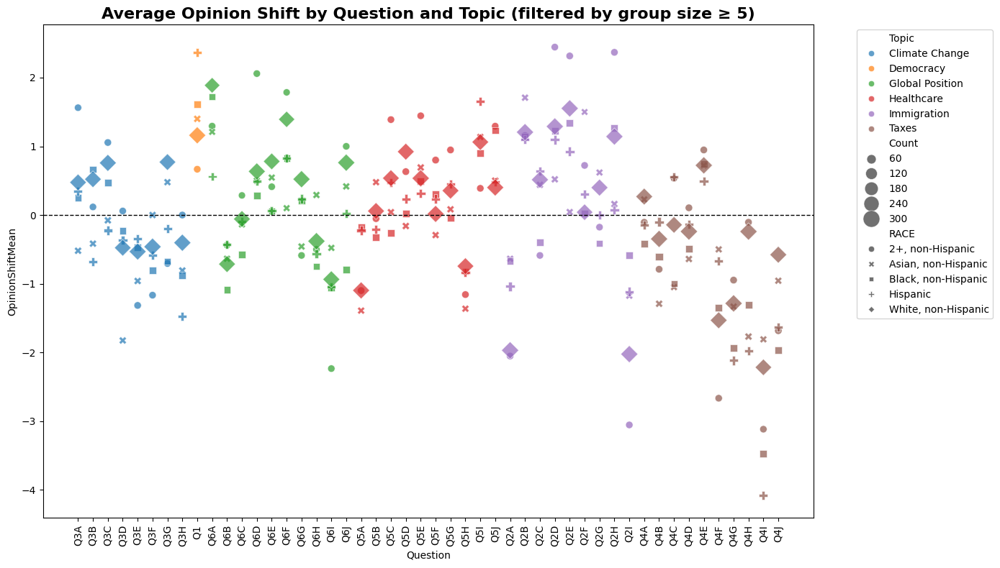

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute counts and means
grouped = plotting_data.groupby(['Topic', 'Question', 'RACE']).agg(
    OpinionShiftMean=('OpinionShift', 'mean'),
    Count=('OpinionShift', 'size')
).reset_index()

# Optionally filter by minimum group size
min_count = 5
filtered = grouped[grouped['Count'] >= min_count]

# Plot with point size by Count
plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.scatterplot(
    data=filtered,
    x='Question',
    y='OpinionShiftMean',
    hue='Topic',
    style='RACE',
    size='Count',
    sizes=(50, 300),  # Min and max point size
    alpha=0.7
)
plt.title('Average Opinion Shift by Question and Topic (filtered by group size ≥ 5)', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.tight_layout()
plt.show()


In [40]:
participant_df['RACE'].value_counts()

White, non-Hispanic    334
Black, non-Hispanic     86
Hispanic                53
Asian, non-Hispanic     26
2+, non-Hispanic        20
Other, non-Hispanic      4
Name: RACE, dtype: int64

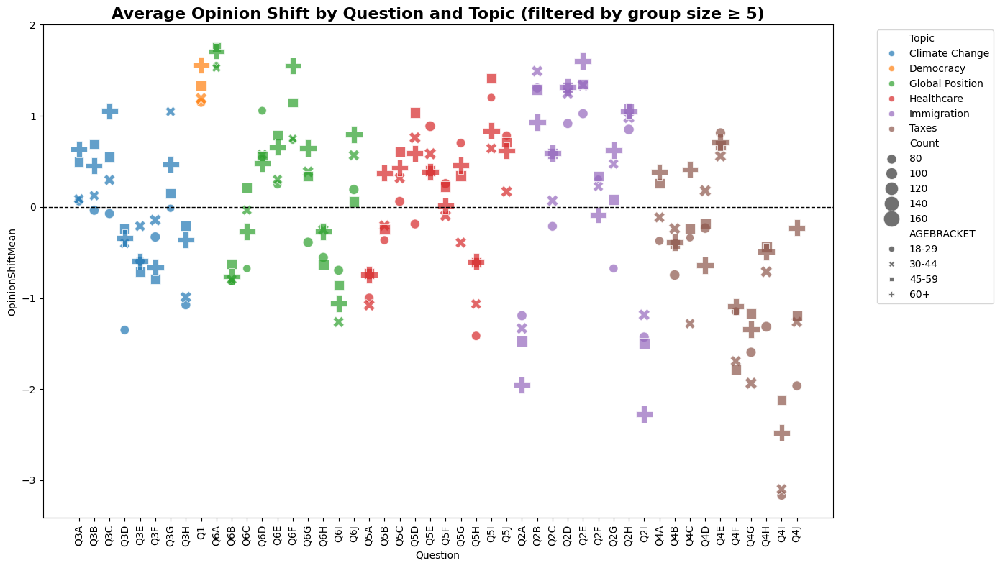

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute counts and means
grouped = plotting_data.groupby(['Topic', 'Question', 'AGEBRACKET']).agg(
    OpinionShiftMean=('OpinionShift', 'mean'),
    Count=('OpinionShift', 'size')
).reset_index()

# Optionally filter by minimum group size
min_count = 5
filtered = grouped[grouped['Count'] >= min_count]

# Plot with point size by Count
plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.scatterplot(
    data=filtered,
    x='Question',
    y='OpinionShiftMean',
    hue='Topic',
    style='AGEBRACKET',
    size='Count',
    sizes=(50, 300),  # Min and max point size
    alpha=0.7
)
plt.title('Average Opinion Shift by Question and Topic (filtered by group size ≥ 5)', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.tight_layout()
plt.show()

In [42]:
participant_df['AGEBRACKET'].value_counts()

60+      177
45-59    145
30-44    112
18-29     89
Name: AGEBRACKET, dtype: int64

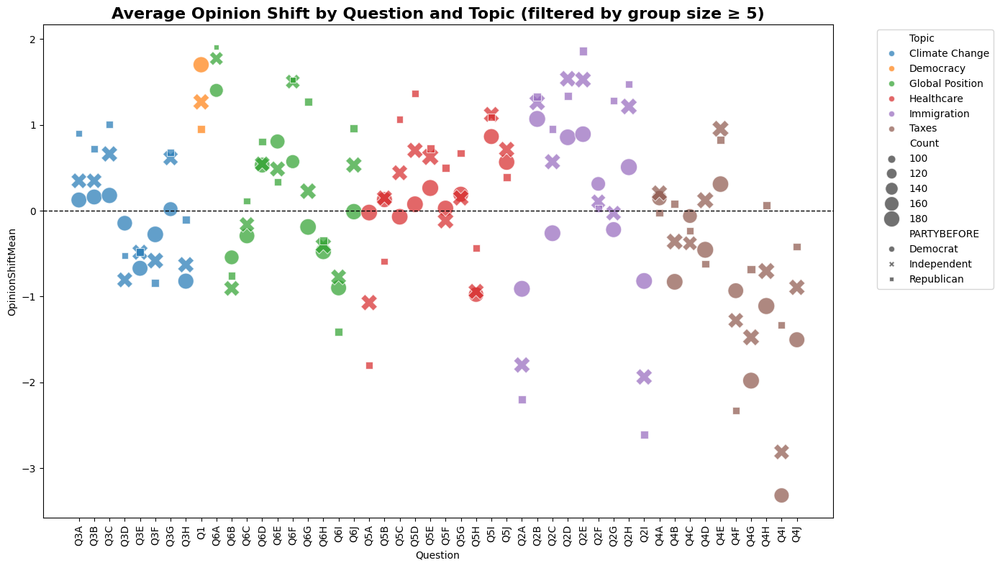

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute counts and means
grouped = plotting_data.groupby(['Topic', 'Question', 'PARTYBEFORE']).agg(
    OpinionShiftMean=('OpinionShift', 'mean'),
    Count=('OpinionShift', 'size')
).reset_index()

# Optionally filter by minimum group size
min_count = 5
filtered = grouped[grouped['Count'] >= min_count]

# Plot with point size by Count
plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.scatterplot(
    data=filtered,
    x='Question',
    y='OpinionShiftMean',
    hue='Topic',
    style='PARTYBEFORE',
    size='Count',
    sizes=(50, 300),  # Min and max point size
    alpha=0.7
)
plt.title('Average Opinion Shift by Question and Topic (filtered by group size ≥ 5)', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.tight_layout()
plt.show()

In [44]:
# i want to find see the mean distance between before and after opinions per question depending on PARTYBEFORE
grouped = plotting_data.groupby(['Topic', 'Question', 'PARTYBEFORE']).agg(
    beforeMean=('BeforeNumber', 'mean'),
    afterMean=('AfterNumber', 'mean'),
    Count=('OpinionShift', 'size')
).reset_index()

In [45]:
dems = grouped[(grouped['PARTYBEFORE'] == 'Democrat')]
reps = grouped[(grouped['PARTYBEFORE'] == 'Republican')]

polar = dems.merge(reps, on=['Topic', 'Question'], how='inner', suffixes=('_Democrat', '_Republican'))
polar['BeforeDiff'] = abs(polar['beforeMean_Democrat'] - polar['beforeMean_Republican'])
polar['AfterDiff'] = abs(polar['afterMean_Democrat'] - polar['afterMean_Republican'])
polar['Depolarised'] = polar['AfterDiff'] < polar['BeforeDiff']

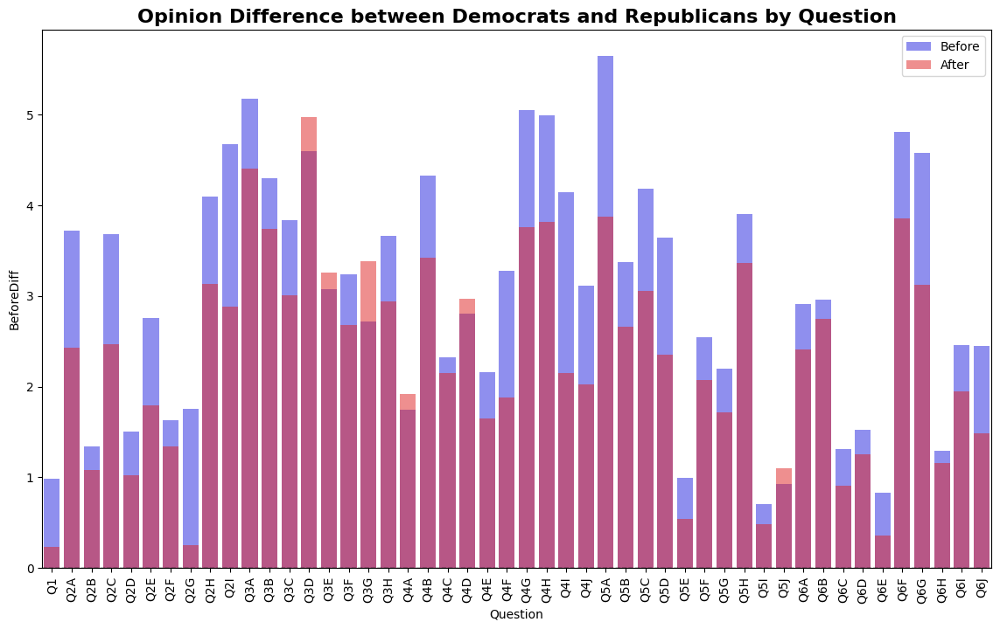

In [46]:
# i want to have a plot with questions on the x axis and the difference in opinion between democrats and republicans on the y axis, with before and after lines
polar.sort_values(by='Question', inplace=True)
fig = plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.barplot(data=polar, x='Question', y='BeforeDiff', color='blue', label='Before',alpha = 0.5)
sns.barplot(data=polar, x='Question', y='AfterDiff', color='red', label='After', alpha=0.5)
plt.title('Opinion Difference between Democrats and Republicans by Question', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)
plt.legend()


In [47]:
# Compute counts and means
grouped = plotting_data.groupby(['Topic', 'Question', 'GENDER']).agg(
    beforeMean=('BeforeNumber', 'mean'),
    afterMean=('AfterNumber', 'mean'),
    Count=('OpinionShift', 'size')
).reset_index()

fem = grouped[(grouped['GENDER'] == 'Female')]
male = grouped[(grouped['GENDER'] == 'Male')]

polar = fem.merge(male, on=['Topic', 'Question'], how='inner', suffixes=('_Female', '_Male'))
polar['BeforeDiff'] = abs(polar['beforeMean_Female'] - polar['beforeMean_Male'])
polar['AfterDiff'] = abs(polar['afterMean_Female'] - polar['afterMean_Male'])
polar['Depolarised'] = polar['AfterDiff'] < polar['BeforeDiff']

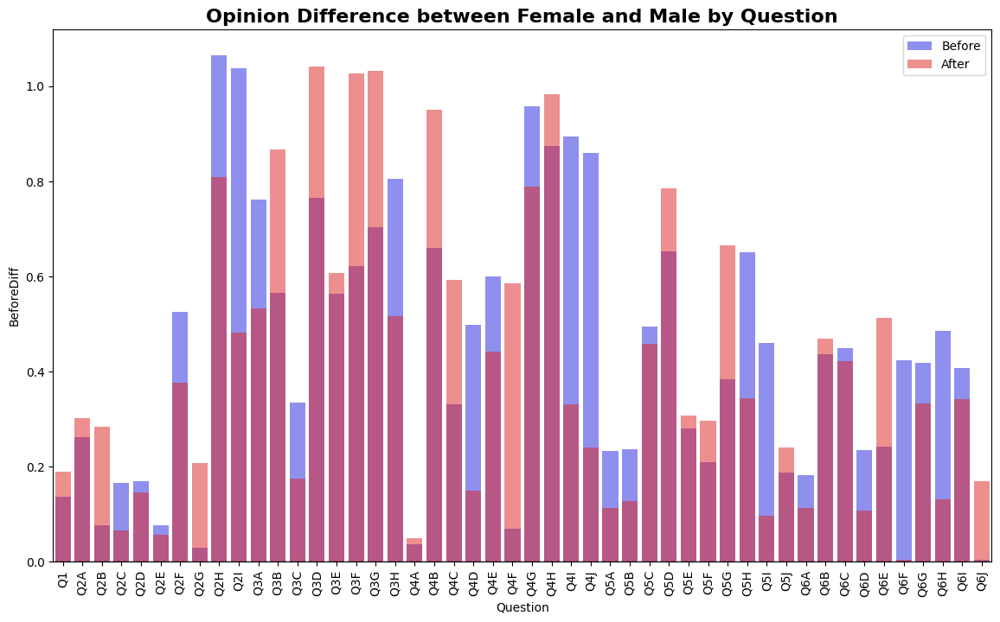

In [48]:
# i want to have a plot with questions on the x axis and the difference in opinion between democrats and republicans on the y axis, with before and after lines
polar.sort_values(by='Question', inplace=True)
fig = plt.figure(figsize=(14, 8))
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
sns.barplot(data=polar, x='Question', y='BeforeDiff', color='blue', label='Before',alpha = 0.5)
sns.barplot(data=polar, x='Question', y='AfterDiff', color='red', label='After', alpha=0.5)
plt.title('Opinion Difference between Female and Male by Question', fontsize=16, fontweight='bold')
plt.xticks(rotation=90)
plt.legend()

In [49]:
master_df[master_df['ID'] == 0]

,ID,Question,QuestionText,Topic,ValidResponse,BeforeNumber,BeforeResponse,AfterNumber,AfterResponse,GROUP,RACE,AGEBRACKET,EDUCATION,PARTYBEFORE,GENDER,AGE,OpinionShift
0,0,Q1,How poorly or well would you say the system of...,Democracy,True,5,In the middle,9,Very strongly favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,4
523,0,Q2A,[Reduce the number of refuges allowed to reset...,Immigration,True,0,Extremely oppose,2,Strongly oppose,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,2
1046,0,Q2B,[Increase personnel to process asylum seekers'...,Immigration,True,10,Strongly favor,10,Strongly favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,0
1569,0,Q2C,[Provide aid to reduce poverty and violence in...,Immigration,True,0,Extremely oppose,7,Moderately favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,7
2092,0,Q2D,[Increase the number of visas for skilled work...,Immigration,True,5,In the middle,10,Strongly favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,5
2615,0,Q2E,[Increase the number of visas for low-skilled ...,Immigration,True,5,In the middle,10,Strongly favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,5
3138,0,Q2F,[Require employers to use the E-verify compute...,Immigration,True,5,In the middle,0,Extremely oppose,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,-5
3661,0,Q2G,[First-time violators of immigration laws shou...,Immigration,True,10,Strongly favor,7,Moderately favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,-3
4184,0,Q2H,"[Continue DACA, the Deferred Action for Childh...",Immigration,True,10,Strongly favor,10,Strongly favor,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,0
4707,0,Q2I,[Undocumented immigrants should be forced to r...,Immigration,True,10,Strongly favor,5,In the middle,1,"White, non-Hispanic",18-29,Some college,Independent,Male,21,-5


In [50]:
cleaned_df.head(1)

,Unnamed: 0,ID,GROUP,CONDITION,Q1,Q2A,Q2B,Q2C,Q2D,Q2E,...,T2Q6G,T2Q6H,T2Q6I,T2Q6J,RACE,AGEBRACKET,EDUCATION,PARTYBEFORE,GENDER,AGE
0,0,0,1,1,5,0,10,0,5,5,...,5,6,0,8,"White, non-Hispanic",18-29,Some college,Independent,Male,21


In [51]:
cols_to_keep = ["ID","GROUP","RACE","AGEBRACKET","EDUCATION","PARTYBEFORE","GENDER","AGE"] + list(questions['Variable'])
cleaned_df[cols_to_keep].to_csv("json_prepared_dataset.csv", index=False)

In [52]:
from scipy.stats import mode

def map_question_to_attitude(question):
    # (same mapping as before)
    if question.startswith('Q1'):
        return 'Democracy System Approval'
    elif question.startswith('Q2'):
        if question.startswith('Q2A') or question.startswith('Q2I'):
            return 'Restrictive Immigration Attitude'
        elif question.startswith('Q2C') or question.startswith('Q2H'):
            return 'Immigration Support Attitude'
        else:
            return 'Immigration Policy Attitude'
    elif question.startswith('Q3'):
        if question.startswith('Q3A') or question.startswith('Q3B') or question.startswith('Q3D'):
            return 'Pro-Climate Regulation Attitude'
        elif question.startswith('Q3E') or question.startswith('Q3F') or question.startswith('Q3G'):
            return 'Pro-Fossil Fuel Attitude'
        else:
            return 'Climate Policy Attitude'
    elif question.startswith('Q4'):
        if question.startswith('Q4B') or question.startswith('Q4D') or question.startswith('Q4E'):
            return 'Progressive Tax/Support Attitude'
        elif question.startswith('Q4C') or question.startswith('Q4F') or question.startswith('Q4G'):
            return 'Tax Reduction/Conservative Attitude'
        else:
            return 'Tax Policy Attitude'
    elif question.startswith('Q5'):
        if question.startswith('Q5A') or question.startswith('Q5B'):
            return 'Healthcare System Reform Attitude'
        elif question.startswith('Q5C') or question.startswith('Q5E') or question.startswith('Q5F'):
            return 'Healthcare Expansion Attitude'
        else:
            return 'Healthcare Policy Attitude'
    else:
        return 'Global Politics Attitude'

def summarize_attitudes_mode(df):
    """
    Summarizes responses by attitude category using mode (most frequent valid response).
    Excludes special codes 77, 98, 99 from mode calculations.
    """
    question_cols = [col for col in df.columns if col.startswith('Q')]
    attitude_map = {}

    for q in question_cols:
        att = map_question_to_attitude(q)
        attitude_map.setdefault(att, []).append(q)

    df_summary = df[['ID']].copy()
    invalid_codes = {77, 98, 99}

    for attitude, questions in attitude_map.items():
        sub_df = df[questions].replace(list(invalid_codes), np.nan)
        # Apply mode per row, ignoring NaNs
        def safe_mode(row):
            clean = row.dropna()
            if clean.empty:
                return np.nan
            m = mode(clean)
            return m.mode[0]

        mode_series = sub_df.apply(safe_mode, axis=1)
        # Map numeric mode to label (handle NaNs)
        df_summary[attitude] = mode_series.apply(lambda v: map_response_label(v) if pd.notna(v) else "No valid response")

    return df_summary

def map_response_label(response_value):
    """
    Map numeric response to textual Likert label, or special code text.
    """
    return likert_scale_map.get(response_value, "Invalid/Unknown response")

# Example usage:

# Example usage:
df = pd.read_csv('json_prepared_dataset.csv')
attitude_modes = summarize_attitudes_mode(df)
attitude_modes_text = attitude_modes.copy()
for col in attitude_modes.columns.drop('ID'):
    attitude_modes_text[col] = attitude_modes_text[col].apply(map_response_label)


/var/folders/qw/dj7vjbyd6kb8q83q6chjb9m00000gn/T/ipykernel_41098/1710593520.py:60: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  m = mode(clean)
/var/folders/qw/dj7vjbyd6kb8q83q6chjb9m00000gn/T/ipykernel_41098/1710593520.py:60: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this w

In [53]:
participant_json_df = df.merge(attitude_modes, on='ID', how='left')

In [54]:
import json

participant_json_df.to_json('participant_attitudes.json', orient='records', lines=True)

In [55]:
# i want to make participant_json_df to be a json file with each row as a json object but with a dictionary that defines the json object stucture
participant_json_df.columns


Index(['ID', 'GROUP', 'RACE', 'AGEBRACKET', 'EDUCATION', 'PARTYBEFORE',
       'GENDER', 'AGE', 'Q1', 'Q2A', 'Q2B', 'Q2C', 'Q2D', 'Q2E', 'Q2F', 'Q2G',
       'Q2H', 'Q2I', 'Q3A', 'Q3B', 'Q3C', 'Q3D', 'Q3E', 'Q3F', 'Q3G', 'Q3H',
       'Q4A', 'Q4B', 'Q4C', 'Q4D', 'Q4E', 'Q4F', 'Q4G', 'Q4H', 'Q4I', 'Q4J',
       'Q5A', 'Q5B', 'Q5C', 'Q5D', 'Q5E', 'Q5F', 'Q5G', 'Q5H', 'Q5I', 'Q5J',
       'Q6A', 'Q6B', 'Q6C', 'Q6D', 'Q6E', 'Q6F', 'Q6G', 'Q6H', 'Q6I', 'Q6J',
       'Democracy System Approval', 'Restrictive Immigration Attitude',
       'Immigration Policy Attitude', 'Immigration Support Attitude',
       'Pro-Climate Regulation Attitude', 'Climate Policy Attitude',
       'Pro-Fossil Fuel Attitude', 'Tax Policy Attitude',
       'Progressive Tax/Support Attitude',
       'Tax Reduction/Conservative Attitude',
       'Healthcare System Reform Attitude', 'Healthcare Expansion Attitude',
       'Healthcare Policy Attitude', 'Global Politics Attitude'],
      dtype='object')

In [56]:
def df_to_structured_json(df, output_filepath):
    # Define columns by section
    demographics_cols = ['RACE', 'AGEBRACKET', 'EDUCATION', 'PARTYBEFORE', 'GENDER', 'AGE']
    # Assuming questions start with Q and end before attitude columns
    question_cols = [c for c in df.columns if c.startswith('Q')]
    # Attitudes are assumed to be all remaining columns after questions and demographics
    attitude_cols = [c for c in df.columns if c not in demographics_cols + question_cols + ["ID","GROUP"]]

    json_list = []
    for _, row in df.iterrows():
        row_dict = {
            'id' : row['ID'],
            'group': row['GROUP'],
            'demographics': {col: row[col] for col in demographics_cols},
            'questions': {col: row[col] for col in question_cols},
            'attitudes': {col: row[col] for col in attitude_cols},
        }
        json_list.append(row_dict)

    with open(output_filepath, 'w', encoding='utf-8') as f:

        json.dump(json_list, f, ensure_ascii=False, indent=4)
        #f.write('[') 
        #for entry in json_list:
        #    json.dump(entry, f)
        #    f.write(',\n')  # write each JSON object on a separate line
        #f.write(']') 
        #f.

In [57]:
df_to_structured_json(participant_json_df,'participant_attitudes.json')

In [58]:
likert_scale_map_text = {
    0: "extremely oppose",
    1: "very strongly oppose",
    2: "strongly oppose",
    3: "moderately oppose",
    4: "slightly oppose",
    5: "do no oppose or favor",
    6: "slightly favor",
    7: "moderately favor",
    8: "strongly favor",
    9: "very strongly favor",
    10: "extremely favor"
}
gender_map_text = {
    "Male" : "You identify as male.",
    "Female" : "You identify as female."
}
party_map_text = {
    "Republican" : "You support the Republican party. ",
    "Democrat" : "You support the Democratic party. ",
    "Independent" : "You support an Independent candidate. "
}
race_map_text = {
    "White, non-Hispanic" : "You identify as White, non-Hispanic. ",
    "Black, non-Hispanic" : "You identify as Black, non-Hispanic. ",
    "Hispanic" : "You identify as Hispanic. ",
    "Asian, non-Hispanic" : "You identify as Asian, non-Hispanic. ",
    "2+, non-Hispanic" : "You identify as multiracial, non-Hispanic. ",
    "Other, non-Hispanic" : "You identify as Other, non-Hispanic. "
}
education_map_text = {
    "No HS Diploma" : "You have not completed a high school diploma. ",
    "Some college" : "You have attended some level of college but have not completed a bachelor's degree. ",
    "HS graduate" : "You have completed a high school diploma. ",
    "BA or above" : "You have completed a bachelor's degree or higher. "
}

In [59]:
json.load(open('participant_attitudes.json'))

[{'id': 0,
  'group': 1,
  'demographics': {'RACE': 'White, non-Hispanic',
   'AGEBRACKET': '18-29',
   'EDUCATION': 'Some college',
   'PARTYBEFORE': 'Independent',
   'GENDER': 'Male',
   'AGE': 21},
  'questions': {'Q1': 5,
   'Q2A': 0,
   'Q2B': 10,
   'Q2C': 0,
   'Q2D': 5,
   'Q2E': 5,
   'Q2F': 5,
   'Q2G': 10,
   'Q2H': 10,
   'Q2I': 10,
   'Q3A': 10,
   'Q3B': 10,
   'Q3C': 10,
   'Q3D': 10,
   'Q3E': 5,
   'Q3F': 0,
   'Q3G': 5,
   'Q3H': 5,
   'Q4A': 0,
   'Q4B': 0,
   'Q4C': 10,
   'Q4D': 0,
   'Q4E': 0,
   'Q4F': 10,
   'Q4G': 0,
   'Q4H': 0,
   'Q4I': 0,
   'Q4J': 0,
   'Q5A': 10,
   'Q5B': 0,
   'Q5C': 0,
   'Q5D': 0,
   'Q5E': 10,
   'Q5F': 10,
   'Q5G': 10,
   'Q5H': 0,
   'Q5I': 10,
   'Q5J': 5,
   'Q6A': 10,
   'Q6B': 0,
   'Q6C': 0,
   'Q6D': 10,
   'Q6E': 0,
   'Q6F': 0,
   'Q6G': 10,
   'Q6H': 10,
   'Q6I': 0,
   'Q6J': 0},
  'attitudes': {'Democracy System Approval': 'In the middle',
   'Restrictive Immigration Attitude': 'Extremely oppose',
   'Immigration Polic